In [18]:
import os
from tqdm import tqdm_notebook as tqdm
import torch
import numpy as np
from PIL import Image
import cv2
import glob
import imageio
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from skimage.transform import resize
from IPython.display import HTML
from PIL import Image

In [19]:
from google.colab.patches import cv2_imshow

In [20]:
from google.colab.drive import mount
mount("/content/drive/")

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [21]:
def display_video(video):
    fig = plt.figure(figsize=(3,3))
    mov = []
    for i in range(len(video)):
        img = plt.imshow(video[i], animated=True)
        plt.axis('off')
        mov.append([img])
    anime = animation.ArtistAnimation(fig, mov, interval=50, repeat_delay=1000)
    plt.close()
    return anime

In [22]:
video1=imageio.mimread(glob.glob("/content/drive/MyDrive/intern/practice/UCF-101/Archery/*")[0])
HTML(display_video(video1).to_html5_video())

In [23]:
len(video1) #video1 is 92 frames of video1

92

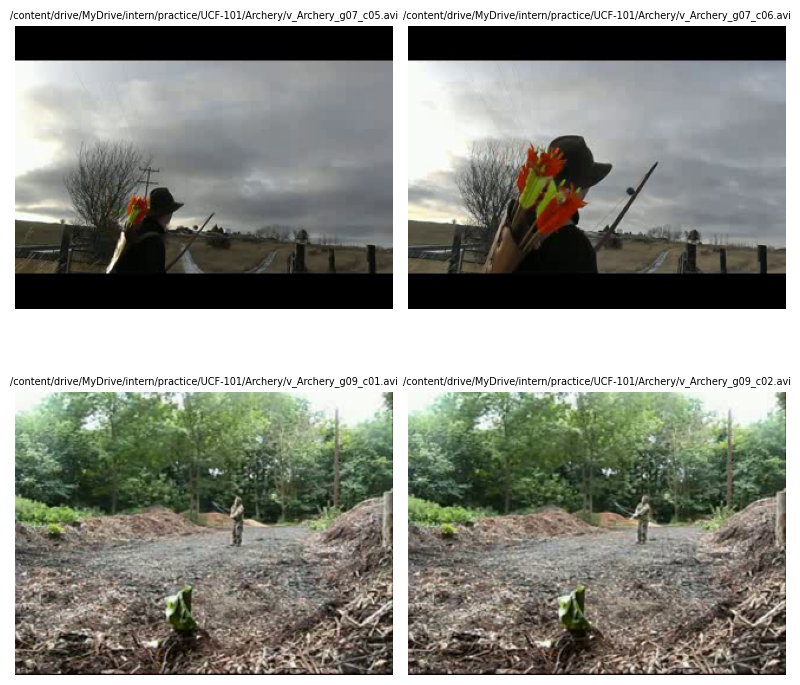

In [24]:
video_paths=glob.glob("/content/drive/MyDrive/intern/practice/UCF-101/Archery/*")[4:10]
videos = [cv2.VideoCapture(path) for path in video_paths]
num_videos = len(videos)
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(8,8))
for i, ax in enumerate(axes.flat):
    if i < num_videos:
        ret, frame = videos[i].read()
        if ret:
            ax.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
            ax.axis('off')
            ax.set_title(f'{video_paths[i]}',fontdict={"fontsize":7})
    else:
        ax.axis('off')
plt.tight_layout()
plt.show()
for video in videos:
    video.release()

#clip model

In [25]:
! pip install git+https://github.com/openai/CLIP.git

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-bpn8zi4j
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-bpn8zi4j
  Resolved https://github.com/openai/CLIP.git to commit a9b1bf5920416aaeaec965c25dd9e8f98c864f16
  Preparing metadata (setup.py) ... done


In [26]:
import clip
clip.available_models()

['RN50',
 'RN101',
 'RN50x4',
 'RN50x16',
 'RN50x64',
 'ViT-B/32',
 'ViT-B/16',
 'ViT-L/14',
 'ViT-L/14@336px']

In [92]:
model, preprocess = clip.load("ViT-L/14")
model=model.float()
input_resolution = model.visual.input_resolution
context_length = model.context_length
vocab_size = model.vocab_size

print("Model parameters:", f"{np.sum([int(np.prod(p.shape)) for p in model.parameters()]):,}")
print("Input resolution:", input_resolution)
print("Context length:", context_length)
print("Vocab size:", vocab_size)

100%|████████████████████████████████████████| 890M/890M [00:07<00:00, 129MiB/s]


Model parameters: 427,616,513
Input resolution: 224
Context length: 77
Vocab size: 49408


In [93]:
preprocess

Compose(
    Resize(size=224, interpolation=bicubic, max_size=None, antialias=warn)
    CenterCrop(size=(224, 224))
    <function _convert_image_to_rgb at 0x7f41fbe72950>
    ToTensor()
    Normalize(mean=(0.48145466, 0.4578275, 0.40821073), std=(0.26862954, 0.26130258, 0.27577711))
)

In [94]:
classes=os.listdir("/content/drive/MyDrive/intern/practice/UCF-101")
len(classes),classes

(101,
 ['BaseballPitch',
  'BenchPress',
  'BreastStroke',
  'CleanAndJerk',
  'Fencing',
  'HighJump',
  'HulaHoop',
  'JavelinThrow',
  'ApplyLipstick',
  'JumpingJack',
  'BabyCrawling',
  'BandMarching',
  'BasketballDunk',
  'BlowDryHair',
  'BodyWeightSquats',
  'Bowling',
  'PlayingPiano',
  'PlayingViolin',
  'BoxingSpeedBag',
  'PommelHorse',
  'BrushingTeeth',
  'CliffDiving',
  'Punch',
  'CricketBowling',
  'CricketShot',
  'CuttingInKitchen',
  'FieldHockeyPenalty',
  'Rowing',
  'SalsaSpin',
  'FloorGymnastics',
  'SkateBoarding',
  'FrisbeeCatch',
  'FrontCrawl',
  'Skijet',
  'Haircut',
  'Hammering',
  'TaiChi',
  'HammerThrow',
  'HandstandPushups',
  'HandstandWalking',
  'TrampolineJumping',
  'VolleyballSpiking',
  'HeadMassage',
  'WalkingWithDog',
  'YoYo',
  'IceDancing',
  'Knitting',
  'LongJump',
  'MoppingFloor',
  'ParallelBars',
  'PlayingCello',
  'PlayingDaf',
  'PlayingDhol',
  'PlayingSitar',
  'Rafting',
  'ShavingBeard',
  'SkyDiving',
  'StillRings'

In [95]:
def text_search(path_folder,text_2_search):
  images=[]
  original_images=[]
  paths=[]
  text_descriptions=[i for i in os.listdir(path_folder)]
  text_descriptions.append(text_2_search)
  text_tokens = clip.tokenize(text_descriptions).cuda()
  for i in glob.glob(f"{path_folder}*/*")[:2000]:
    cap=cv2.VideoCapture(i)
    ret,img=cap.read()
    img=cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    image=Image.fromarray(img)
    images.append(preprocess(image))
    original_images.append(image)
    paths.append(i)
    if len(images)==300:
      image_input= torch.tensor(np.stack(images)).cuda()
      with torch.no_grad():
        image_features= model.encode_image(image_input).float()
        text_features = model.encode_text(text_tokens).float()
        text_features /= text_features.norm(dim=-1, keepdim=True)
      text_probs = (100.0 * image_features @ text_features.T).softmax(dim=-1)
      top_probs, top_labels = text_probs.cpu().topk(5, dim=-1)
      for j in range(300):
        if text_descriptions[top_labels[j][0]]==text_2_search or text_descriptions[top_labels[j][1]]==text_2_search:
            print([text_descriptions[index] for index in top_labels[j]],paths[j])
            original_images[j].show()
      images=[]
      original_images=[]
      paths=[]

['BaseballPitch', 'weight traning', 'JugglingBalls', 'HammerThrow', 'CricketShot'] /content/drive/MyDrive/intern/practice/UCF-101/BaseballPitch/v_BaseballPitch_g10_c01.avi


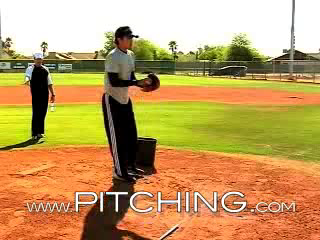

['BenchPress', 'weight traning', 'ParallelBars', 'CleanAndJerk', 'JavelinThrow'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g01_c01.avi


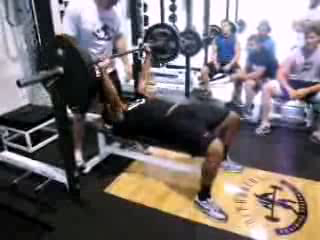

['BenchPress', 'weight traning', 'ParallelBars', 'CleanAndJerk', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g01_c03.avi


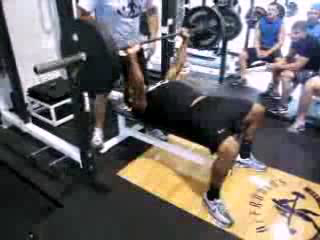

['BenchPress', 'weight traning', 'CleanAndJerk', 'ParallelBars', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g01_c04.avi


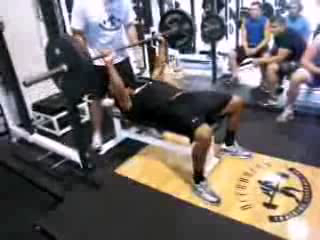

['BenchPress', 'weight traning', 'CleanAndJerk', 'ParallelBars', 'JavelinThrow'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g01_c05.avi


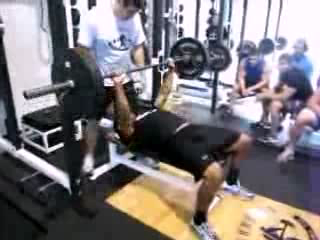

['BenchPress', 'weight traning', 'CleanAndJerk', 'ParallelBars', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g01_c06.avi


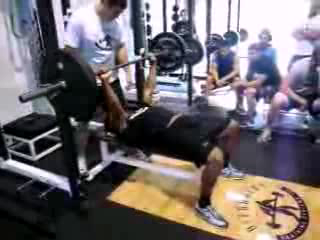

['BenchPress', 'weight traning', 'ParallelBars', 'CleanAndJerk', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g02_c01.avi


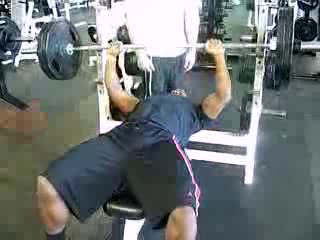

['BenchPress', 'weight traning', 'CleanAndJerk', 'ParallelBars', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g02_c04.avi


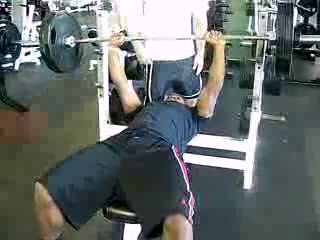

['BenchPress', 'weight traning', 'CleanAndJerk', 'ParallelBars', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g02_c03.avi


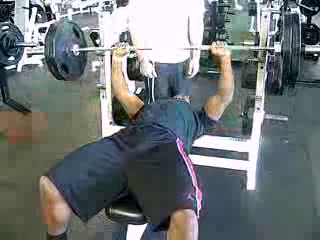

['BenchPress', 'weight traning', 'ParallelBars', 'CleanAndJerk', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g02_c06.avi


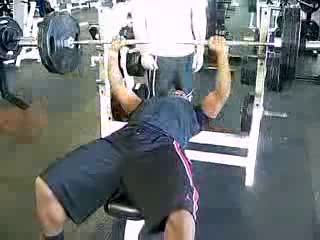

['BenchPress', 'weight traning', 'ParallelBars', 'CleanAndJerk', 'Hammering'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g03_c01.avi


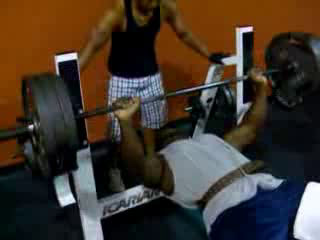

['weight traning', 'BenchPress', 'CleanAndJerk', 'ParallelBars', 'Hammering'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g03_c02.avi


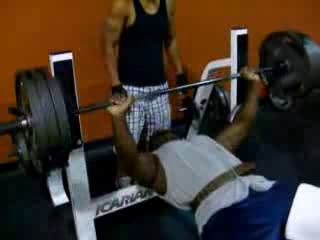

['weight traning', 'BenchPress', 'CleanAndJerk', 'ParallelBars', 'Hammering'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g03_c03.avi


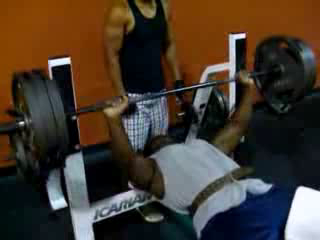

['BenchPress', 'weight traning', 'CleanAndJerk', 'ParallelBars', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g03_c04.avi


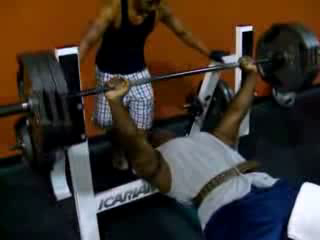

['BenchPress', 'weight traning', 'CleanAndJerk', 'ParallelBars', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g03_c05.avi


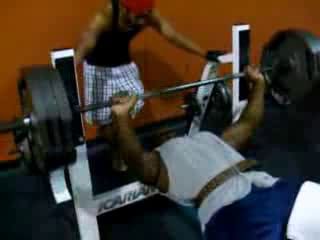

['BenchPress', 'weight traning', 'ParallelBars', 'CleanAndJerk', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g03_c07.avi


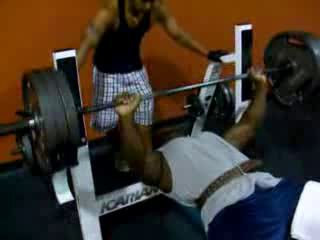

['BenchPress', 'weight traning', 'ParallelBars', 'CleanAndJerk', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g03_c06.avi


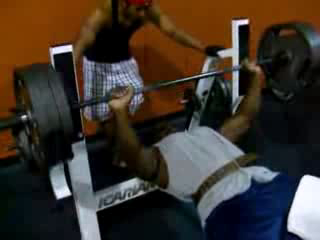

['BenchPress', 'weight traning', 'CleanAndJerk', 'ParallelBars', 'JavelinThrow'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g04_c04.avi


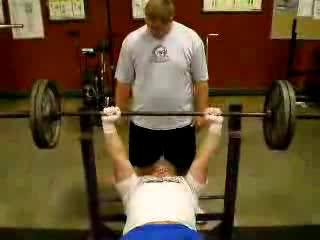

['BenchPress', 'weight traning', 'CleanAndJerk', 'ParallelBars', 'JavelinThrow'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g04_c05.avi


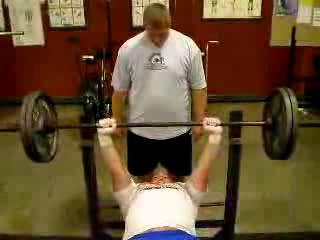

['BenchPress', 'weight traning', 'CleanAndJerk', 'ParallelBars', 'HandstandPushups'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g05_c01.avi


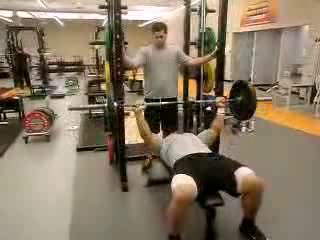

['BenchPress', 'weight traning', 'CleanAndJerk', 'ParallelBars', 'HandstandPushups'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g05_c02.avi


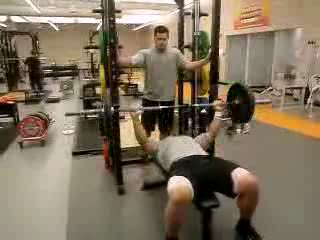

['BenchPress', 'weight traning', 'CleanAndJerk', 'ParallelBars', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g05_c04.avi


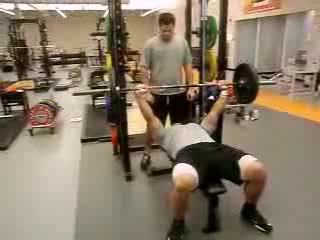

['BenchPress', 'weight traning', 'CleanAndJerk', 'ParallelBars', 'HandstandPushups'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g05_c05.avi


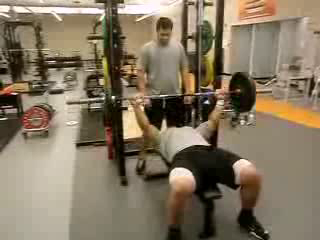

['BenchPress', 'weight traning', 'CleanAndJerk', 'ParallelBars', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g05_c06.avi


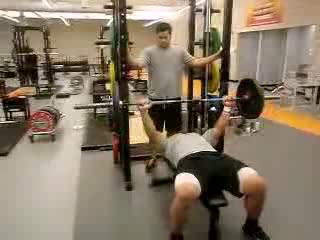

['weight traning', 'ParallelBars', 'BenchPress', 'CleanAndJerk', 'JavelinThrow'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g06_c01.avi


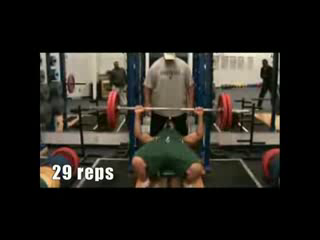

['weight traning', 'BenchPress', 'ParallelBars', 'CleanAndJerk', 'JavelinThrow'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g06_c02.avi


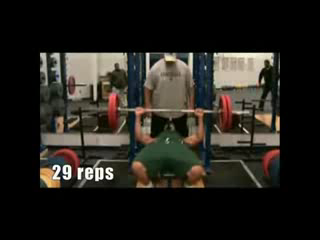

['weight traning', 'BenchPress', 'ParallelBars', 'CleanAndJerk', 'JavelinThrow'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g06_c03.avi


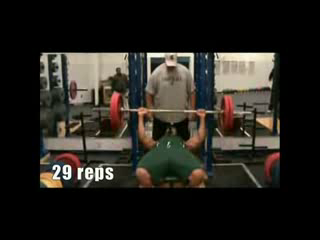

['weight traning', 'BenchPress', 'ParallelBars', 'CleanAndJerk', 'HandstandPushups'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g06_c04.avi


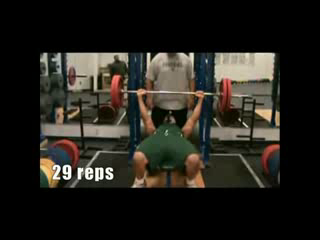

['weight traning', 'BenchPress', 'ParallelBars', 'CleanAndJerk', 'JavelinThrow'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g06_c05.avi


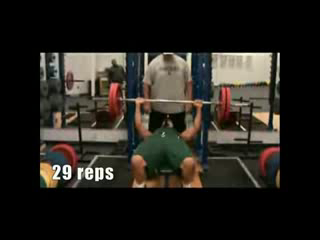

['weight traning', 'BenchPress', 'ParallelBars', 'CleanAndJerk', 'BodyWeightSquats'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g06_c06.avi


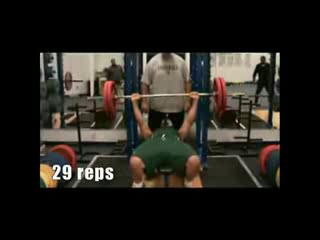

['weight traning', 'BenchPress', 'ParallelBars', 'CleanAndJerk', 'BodyWeightSquats'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g06_c07.avi


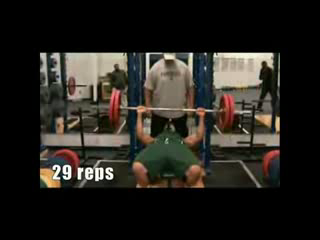

['BenchPress', 'weight traning', 'CleanAndJerk', 'ParallelBars', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g07_c02.avi


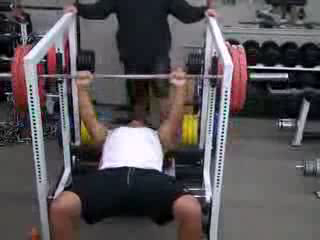

['BenchPress', 'weight traning', 'CleanAndJerk', 'ParallelBars', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g07_c01.avi


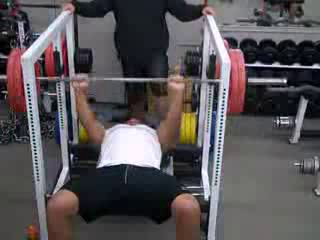

['BenchPress', 'weight traning', 'CleanAndJerk', 'ParallelBars', 'PullUps'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g07_c03.avi


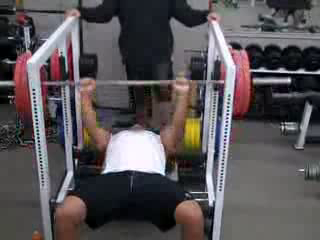

['BenchPress', 'weight traning', 'ParallelBars', 'CleanAndJerk', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g07_c04.avi


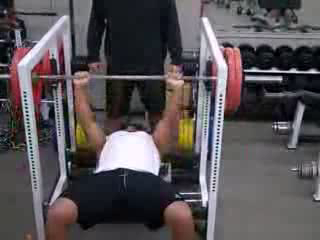

['BenchPress', 'weight traning', 'ParallelBars', 'CleanAndJerk', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g07_c05.avi


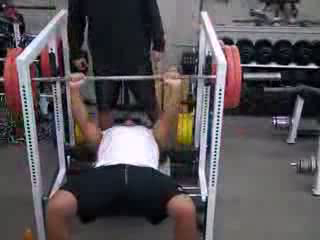

['BenchPress', 'weight traning', 'CleanAndJerk', 'ParallelBars', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g07_c06.avi


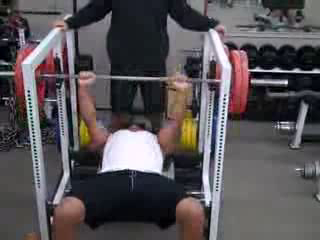

['BenchPress', 'weight traning', 'CleanAndJerk', 'ParallelBars', 'HandstandPushups'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g07_c07.avi


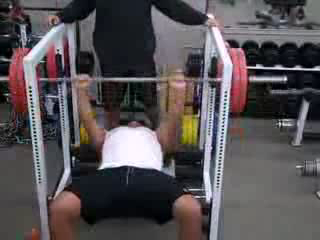

['BenchPress', 'weight traning', 'CleanAndJerk', 'ParallelBars', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g08_c03.avi


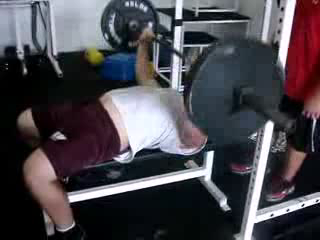

['BenchPress', 'weight traning', 'CleanAndJerk', 'ParallelBars', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g08_c05.avi


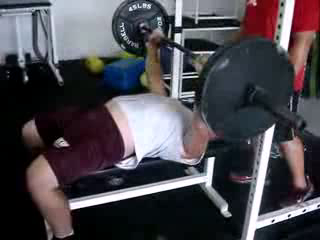

['BenchPress', 'weight traning', 'CleanAndJerk', 'ParallelBars', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g08_c07.avi


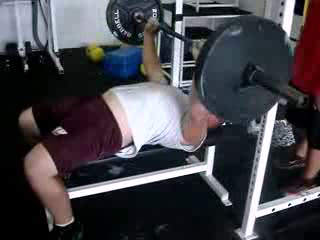

['BenchPress', 'weight traning', 'CleanAndJerk', 'ParallelBars', 'Hammering'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g09_c01.avi


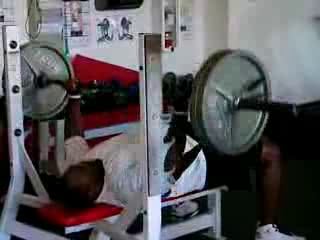

['BenchPress', 'weight traning', 'ParallelBars', 'CleanAndJerk', 'Hammering'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g09_c02.avi


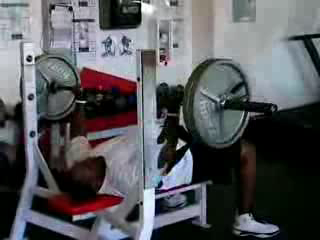

['BenchPress', 'weight traning', 'ParallelBars', 'CleanAndJerk', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g09_c03.avi


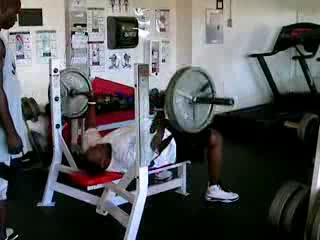

['BenchPress', 'weight traning', 'ParallelBars', 'CleanAndJerk', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g09_c04.avi


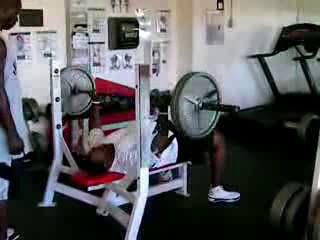

['BenchPress', 'weight traning', 'ParallelBars', 'CleanAndJerk', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g09_c05.avi


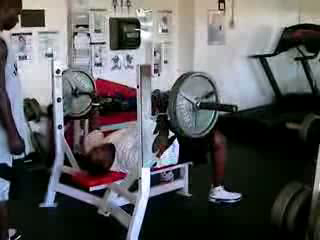

['weight traning', 'BenchPress', 'ParallelBars', 'CleanAndJerk', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g09_c06.avi


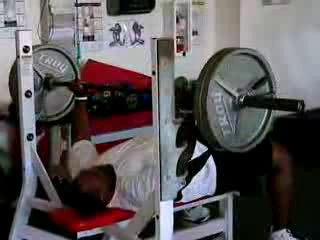

['BenchPress', 'weight traning', 'ParallelBars', 'CleanAndJerk', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g09_c07.avi


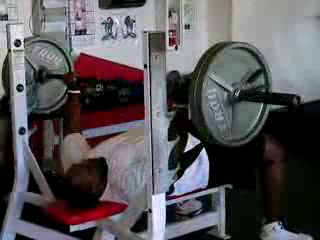

['weight traning', 'BenchPress', 'CleanAndJerk', 'ParallelBars', 'BodyWeightSquats'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g10_c01.avi


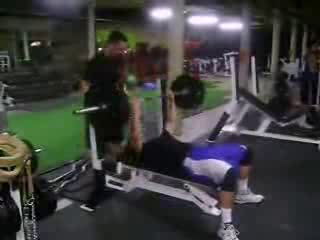

['BenchPress', 'weight traning', 'ParallelBars', 'CleanAndJerk', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g10_c02.avi


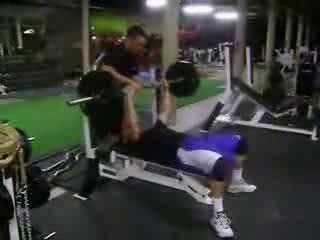

['weight traning', 'BenchPress', 'CleanAndJerk', 'ParallelBars', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g10_c03.avi


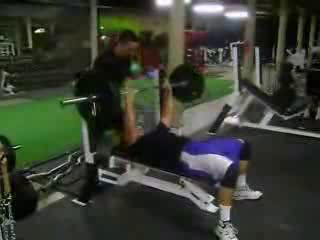

['BenchPress', 'weight traning', 'ParallelBars', 'CleanAndJerk', 'BodyWeightSquats'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g10_c04.avi


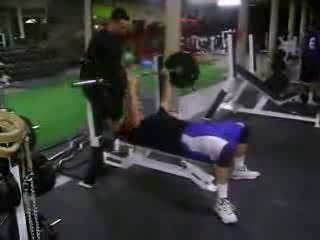

['BenchPress', 'weight traning', 'CleanAndJerk', 'ParallelBars', 'Hammering'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g11_c01.avi


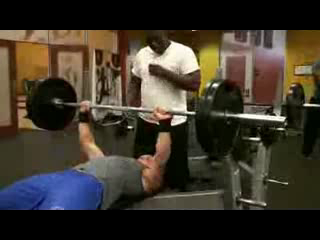

['BenchPress', 'weight traning', 'CleanAndJerk', 'ParallelBars', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g11_c02.avi


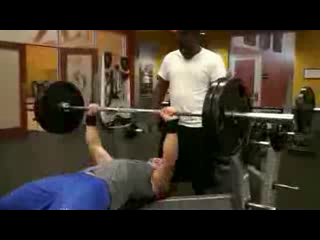

['BenchPress', 'weight traning', 'CleanAndJerk', 'ParallelBars', 'Hammering'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g11_c03.avi


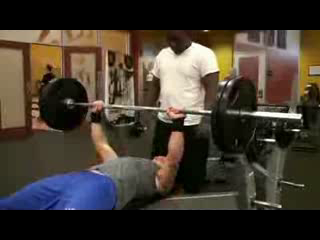

['BenchPress', 'weight traning', 'CleanAndJerk', 'ParallelBars', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g11_c04.avi


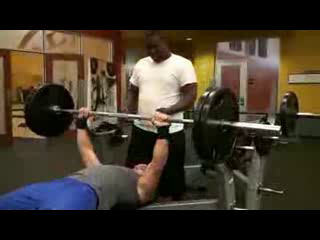

['BenchPress', 'weight traning', 'CleanAndJerk', 'ParallelBars', 'Hammering'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g11_c05.avi


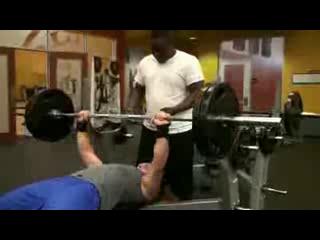

['BenchPress', 'weight traning', 'ParallelBars', 'CleanAndJerk', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g12_c01.avi


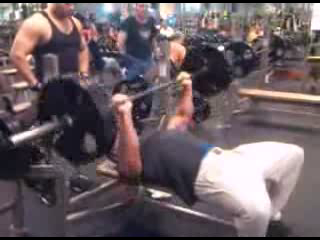

['BenchPress', 'weight traning', 'ParallelBars', 'CleanAndJerk', 'Hammering'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g12_c02.avi


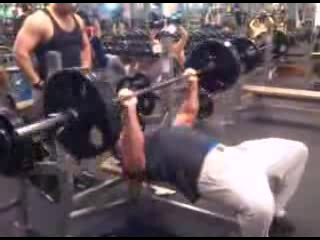

['BenchPress', 'weight traning', 'ParallelBars', 'CleanAndJerk', 'Hammering'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g12_c03.avi


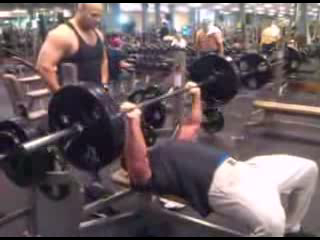

['BenchPress', 'weight traning', 'CleanAndJerk', 'ParallelBars', 'Hammering'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g12_c04.avi


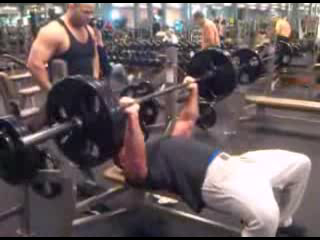

['BenchPress', 'weight traning', 'ParallelBars', 'CleanAndJerk', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g12_c05.avi


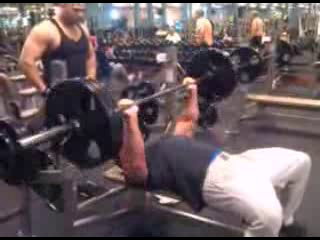

['BenchPress', 'weight traning', 'ParallelBars', 'CleanAndJerk', 'Hammering'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g12_c06.avi


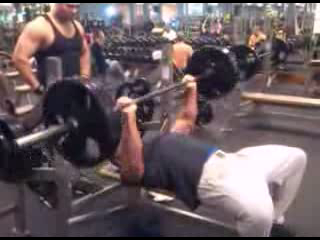

['BenchPress', 'weight traning', 'ParallelBars', 'CleanAndJerk', 'Hammering'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g12_c07.avi


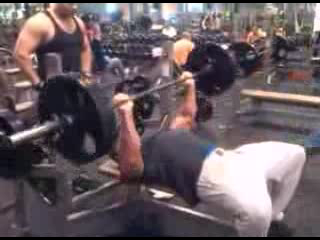

['BenchPress', 'weight traning', 'CleanAndJerk', 'ParallelBars', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g13_c01.avi


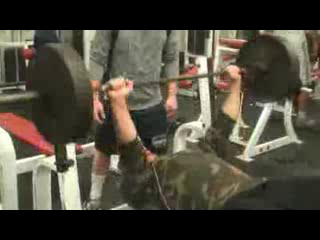

['BenchPress', 'weight traning', 'CleanAndJerk', 'ParallelBars', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g13_c02.avi


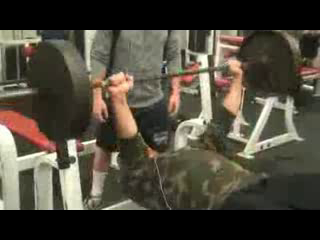

['BenchPress', 'weight traning', 'CleanAndJerk', 'ParallelBars', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g13_c03.avi


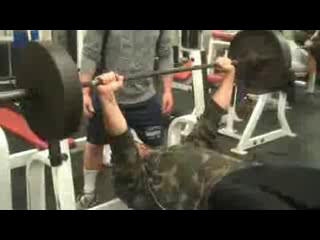

['BenchPress', 'weight traning', 'CleanAndJerk', 'ParallelBars', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g13_c04.avi


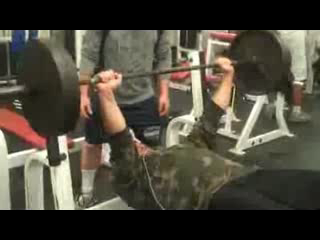

['BenchPress', 'weight traning', 'CleanAndJerk', 'ParallelBars', 'JavelinThrow'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g13_c05.avi


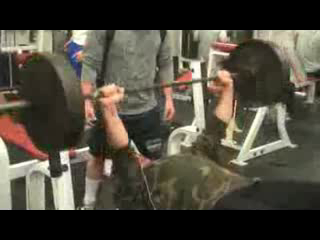

['BenchPress', 'weight traning', 'CleanAndJerk', 'ParallelBars', 'Shotput'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g13_c06.avi


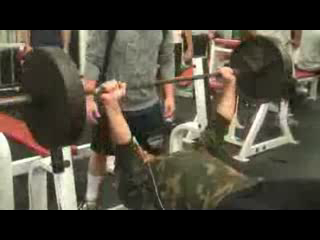

['BenchPress', 'weight traning', 'CleanAndJerk', 'ParallelBars', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g13_c07.avi


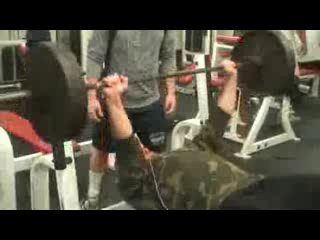

['BenchPress', 'weight traning', 'ParallelBars', 'CleanAndJerk', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g14_c01.avi


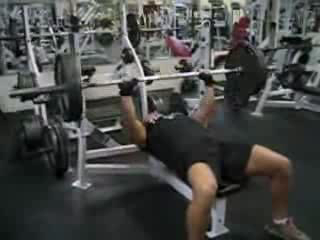

['BenchPress', 'weight traning', 'ParallelBars', 'CleanAndJerk', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g14_c02.avi


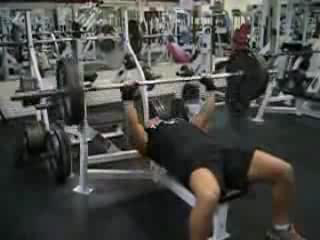

['BenchPress', 'weight traning', 'ParallelBars', 'CleanAndJerk', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g14_c03.avi


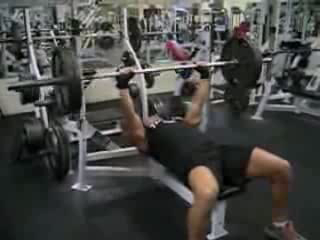

['BenchPress', 'weight traning', 'ParallelBars', 'CleanAndJerk', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g14_c04.avi


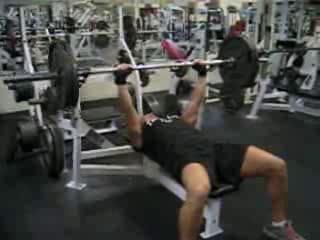

['BenchPress', 'weight traning', 'ParallelBars', 'CleanAndJerk', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g14_c06.avi


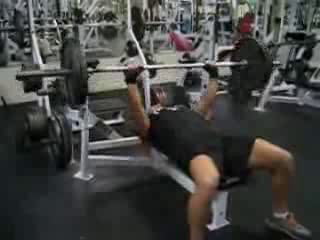

['BenchPress', 'weight traning', 'ParallelBars', 'CleanAndJerk', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g14_c07.avi


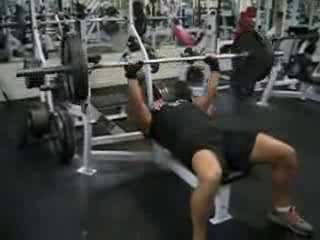

['BenchPress', 'weight traning', 'ParallelBars', 'CleanAndJerk', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g15_c01.avi


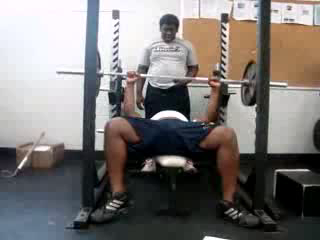

['BenchPress', 'weight traning', 'CleanAndJerk', 'ParallelBars', 'PullUps'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g15_c03.avi


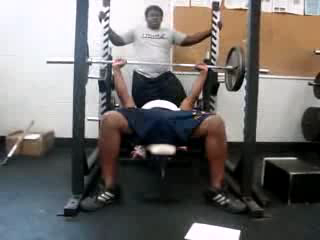

['BenchPress', 'weight traning', 'ParallelBars', 'CleanAndJerk', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g15_c05.avi


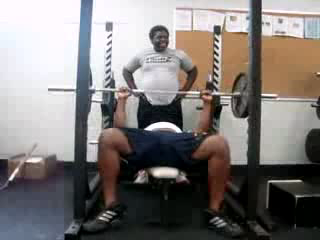

['BenchPress', 'weight traning', 'ParallelBars', 'CleanAndJerk', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g15_c04.avi


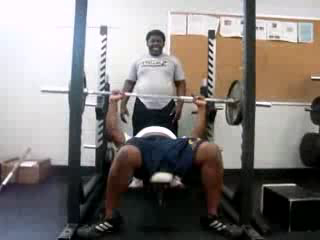

['BenchPress', 'weight traning', 'CleanAndJerk', 'ParallelBars', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g15_c06.avi


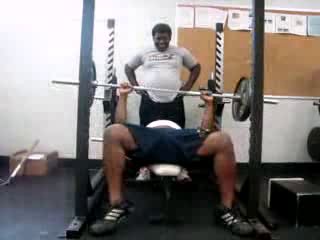

['BenchPress', 'weight traning', 'CleanAndJerk', 'ParallelBars', 'HandstandPushups'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g16_c02.avi


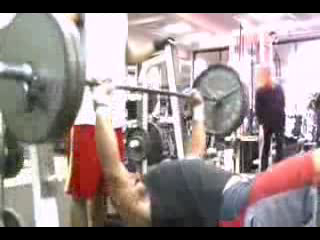

['weight traning', 'CleanAndJerk', 'BenchPress', 'ParallelBars', 'Shotput'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g16_c04.avi


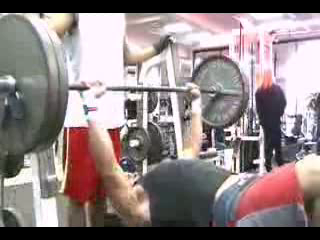

['weight traning', 'BenchPress', 'CleanAndJerk', 'ParallelBars', 'HandstandPushups'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g16_c05.avi


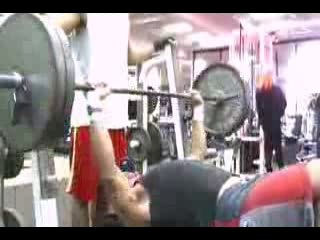

['BenchPress', 'weight traning', 'CleanAndJerk', 'ParallelBars', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g17_c02.avi


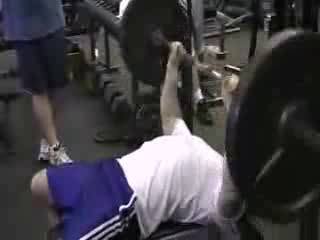

['BenchPress', 'weight traning', 'CleanAndJerk', 'ParallelBars', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g17_c04.avi


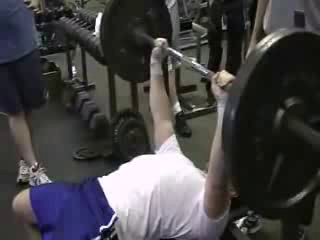

['BenchPress', 'weight traning', 'CleanAndJerk', 'ParallelBars', 'JavelinThrow'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g17_c05.avi


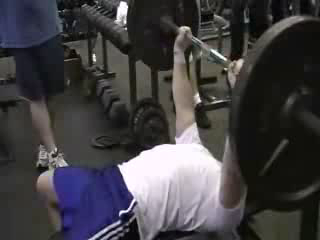

['BenchPress', 'weight traning', 'CleanAndJerk', 'ParallelBars', 'HandstandPushups'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g17_c07.avi


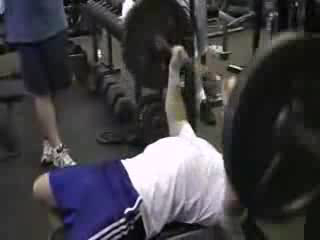

['BenchPress', 'weight traning', 'ParallelBars', 'CleanAndJerk', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g18_c04.avi


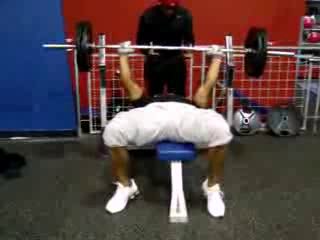

['BenchPress', 'weight traning', 'ParallelBars', 'CleanAndJerk', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g18_c05.avi


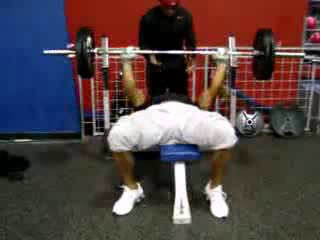

['BenchPress', 'weight traning', 'CleanAndJerk', 'ParallelBars', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g18_c07.avi


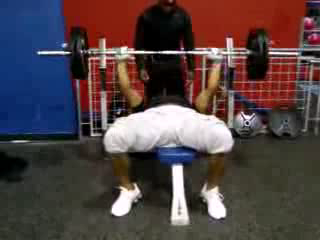

['BenchPress', 'weight traning', 'CleanAndJerk', 'Nunchucks', 'PushUps'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g19_c02.avi


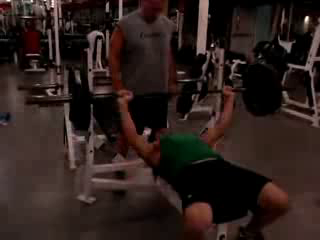

['BenchPress', 'weight traning', 'CleanAndJerk', 'ParallelBars', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g19_c04.avi


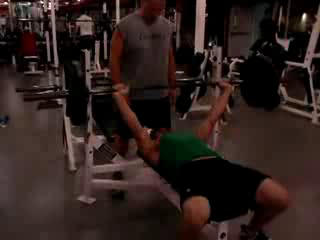

['BenchPress', 'weight traning', 'CleanAndJerk', 'ParallelBars', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g19_c06.avi


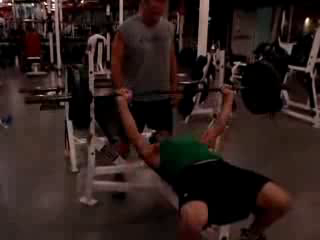

['BenchPress', 'weight traning', 'ParallelBars', 'CleanAndJerk', 'PushUps'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g20_c01.avi


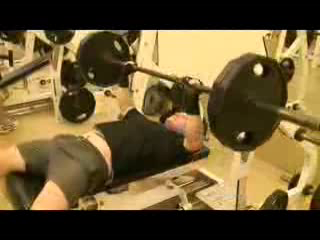

['BenchPress', 'weight traning', 'ParallelBars', 'CleanAndJerk', 'BodyWeightSquats'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g20_c02.avi


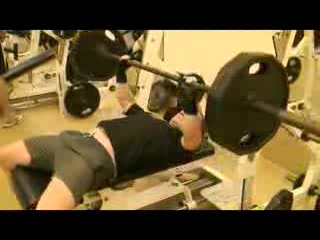

['BenchPress', 'weight traning', 'ParallelBars', 'CleanAndJerk', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g20_c03.avi


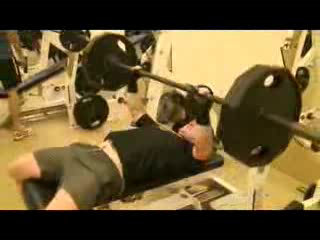

['BenchPress', 'weight traning', 'ParallelBars', 'CleanAndJerk', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g20_c04.avi


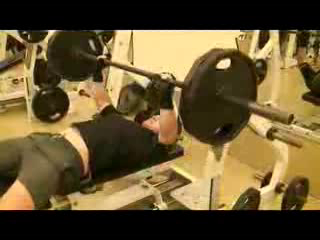

['BenchPress', 'weight traning', 'ParallelBars', 'CleanAndJerk', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g20_c05.avi


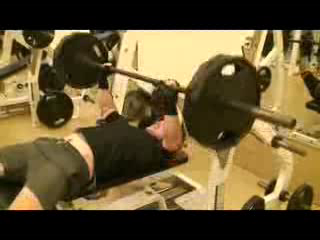

['BenchPress', 'weight traning', 'CleanAndJerk', 'ParallelBars', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g20_c06.avi


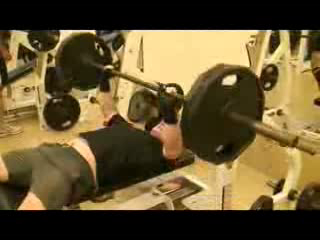

['BenchPress', 'weight traning', 'ParallelBars', 'CleanAndJerk', 'BodyWeightSquats'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g20_c07.avi


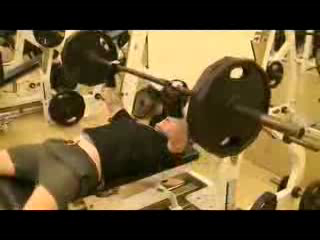

['BenchPress', 'weight traning', 'CleanAndJerk', 'ParallelBars', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g22_c01.avi


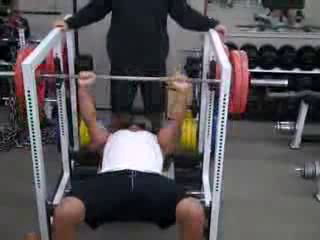

['BenchPress', 'weight traning', 'CleanAndJerk', 'ParallelBars', 'HandstandPushups'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g22_c02.avi


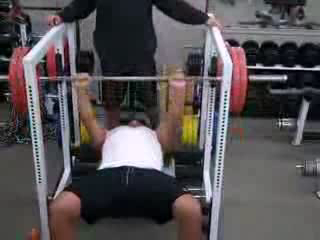

['BenchPress', 'weight traning', 'CleanAndJerk', 'ParallelBars', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g22_c03.avi


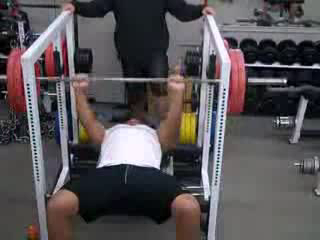

['BenchPress', 'weight traning', 'CleanAndJerk', 'ParallelBars', 'HandstandPushups'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g22_c04.avi


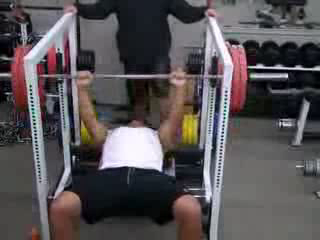

['BenchPress', 'weight traning', 'CleanAndJerk', 'ParallelBars', 'PullUps'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g22_c05.avi


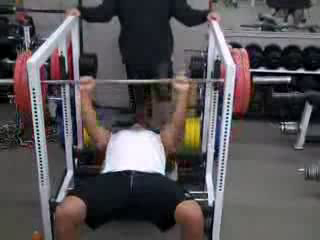

['BenchPress', 'weight traning', 'ParallelBars', 'CleanAndJerk', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g22_c06.avi


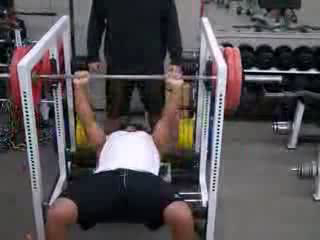

['BenchPress', 'weight traning', 'CleanAndJerk', 'ParallelBars', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g22_c07.avi


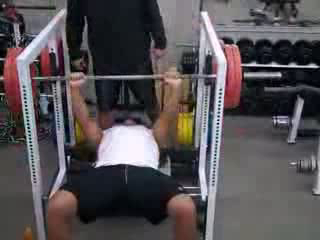

['BenchPress', 'weight traning', 'CleanAndJerk', 'ParallelBars', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g23_c01.avi


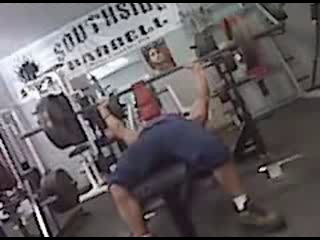

['BenchPress', 'weight traning', 'ParallelBars', 'CleanAndJerk', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g23_c03.avi


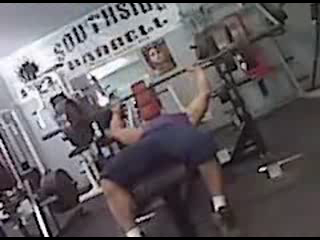

['BenchPress', 'weight traning', 'CleanAndJerk', 'ParallelBars', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g24_c01.avi


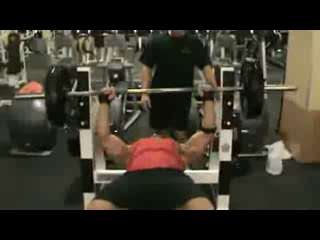

['BenchPress', 'weight traning', 'ParallelBars', 'CleanAndJerk', 'Hammering'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g24_c03.avi


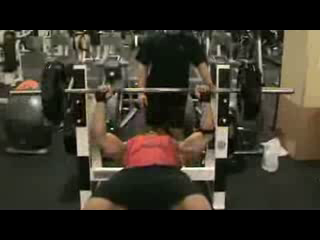

['BenchPress', 'weight traning', 'ParallelBars', 'CleanAndJerk', 'HandstandPushups'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g24_c02.avi


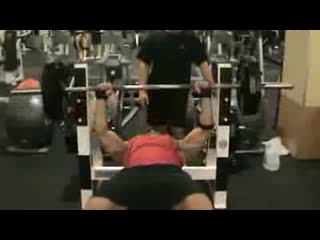

['BenchPress', 'weight traning', 'CleanAndJerk', 'ParallelBars', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g24_c04.avi


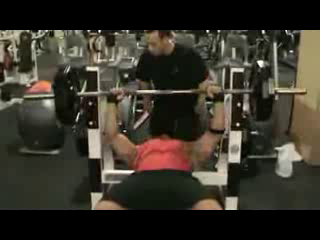

['BenchPress', 'weight traning', 'CleanAndJerk', 'ParallelBars', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g24_c05.avi


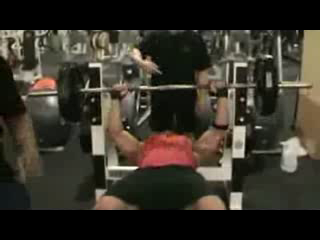

['BenchPress', 'weight traning', 'ParallelBars', 'CleanAndJerk', 'PullUps'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g24_c06.avi


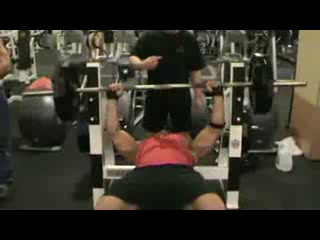

['BenchPress', 'weight traning', 'ParallelBars', 'CleanAndJerk', 'Billiards'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g24_c07.avi


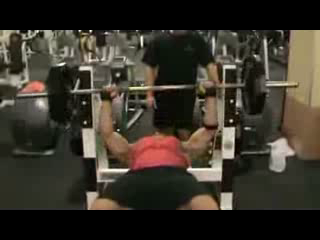

['BenchPress', 'weight traning', 'ParallelBars', 'CleanAndJerk', 'HandstandPushups'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g25_c01.avi


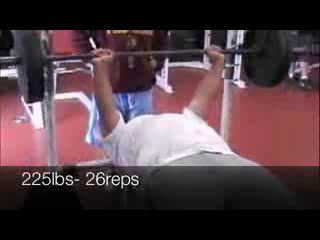

['BenchPress', 'weight traning', 'ParallelBars', 'CleanAndJerk', 'BodyWeightSquats'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g25_c02.avi


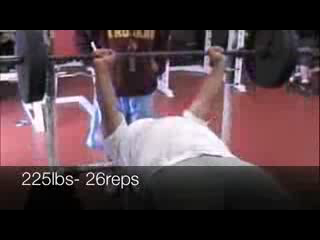

['weight traning', 'BenchPress', 'ParallelBars', 'CleanAndJerk', 'BodyWeightSquats'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g25_c04.avi


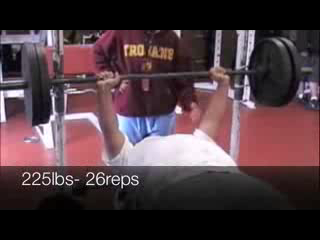

['weight traning', 'BenchPress', 'ParallelBars', 'CleanAndJerk', 'BodyWeightSquats'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g25_c05.avi


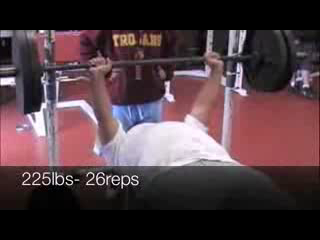

['BenchPress', 'weight traning', 'ParallelBars', 'CleanAndJerk', 'BodyWeightSquats'] /content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g25_c06.avi


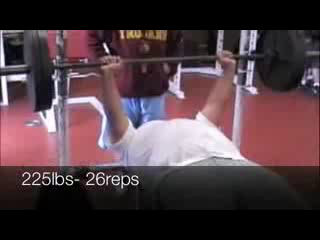

['CleanAndJerk', 'weight traning', 'ParallelBars', 'BodyWeightSquats', 'ThrowDiscus'] /content/drive/MyDrive/intern/practice/UCF-101/CleanAndJerk/v_CleanAndJerk_g01_c01.avi


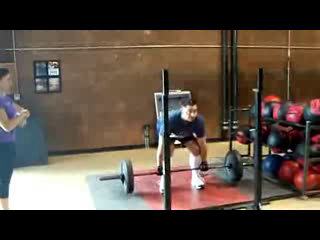

['weight traning', 'CleanAndJerk', 'BodyWeightSquats', 'HammerThrow', 'ParallelBars'] /content/drive/MyDrive/intern/practice/UCF-101/CleanAndJerk/v_CleanAndJerk_g01_c02.avi


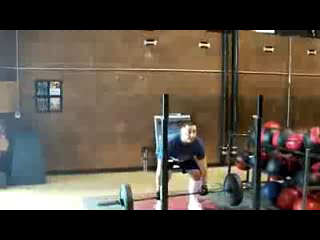

['weight traning', 'BodyWeightSquats', 'CleanAndJerk', 'ParallelBars', 'Lunges'] /content/drive/MyDrive/intern/practice/UCF-101/CleanAndJerk/v_CleanAndJerk_g01_c03.avi


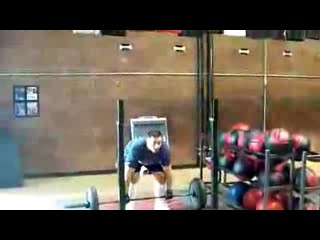

['weight traning', 'CleanAndJerk', 'ParallelBars', 'BodyWeightSquats', 'Shotput'] /content/drive/MyDrive/intern/practice/UCF-101/CleanAndJerk/v_CleanAndJerk_g01_c04.avi


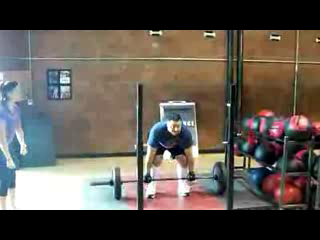

['weight traning', 'CleanAndJerk', 'BenchPress', 'BodyWeightSquats', 'Shotput'] /content/drive/MyDrive/intern/practice/UCF-101/CleanAndJerk/v_CleanAndJerk_g01_c05.avi


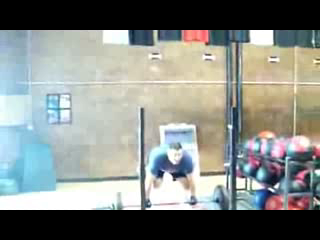

['CleanAndJerk', 'weight traning', 'ParallelBars', 'HammerThrow', 'JumpRope'] /content/drive/MyDrive/intern/practice/UCF-101/CleanAndJerk/v_CleanAndJerk_g02_c03.avi


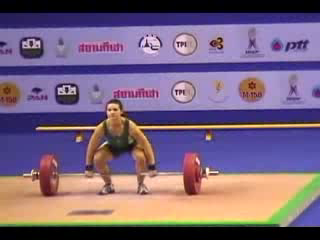

['CleanAndJerk', 'weight traning', 'Nunchucks', 'JumpRope', 'WritingOnBoard'] /content/drive/MyDrive/intern/practice/UCF-101/CleanAndJerk/v_CleanAndJerk_g09_c03.avi


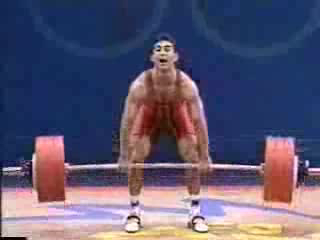

['CleanAndJerk', 'weight traning', 'ParallelBars', 'JavelinThrow', 'Nunchucks'] /content/drive/MyDrive/intern/practice/UCF-101/CleanAndJerk/v_CleanAndJerk_g10_c01.avi


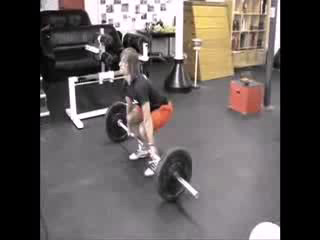

['CleanAndJerk', 'weight traning', 'JavelinThrow', 'BodyWeightSquats', 'ParallelBars'] /content/drive/MyDrive/intern/practice/UCF-101/CleanAndJerk/v_CleanAndJerk_g10_c02.avi


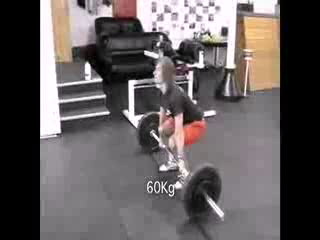

['CleanAndJerk', 'weight traning', 'Nunchucks', 'JumpRope', 'WritingOnBoard'] /content/drive/MyDrive/intern/practice/UCF-101/CleanAndJerk/v_CleanAndJerk_g10_c03.avi


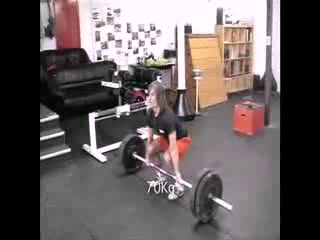

['CleanAndJerk', 'weight traning', 'ParallelBars', 'HammerThrow', 'JumpRope'] /content/drive/MyDrive/intern/practice/UCF-101/CleanAndJerk/v_CleanAndJerk_g10_c04.avi


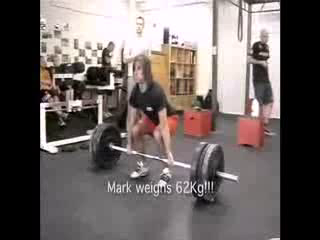

['CleanAndJerk', 'weight traning', 'HammerThrow', 'BodyWeightSquats', 'PlayingDaf'] /content/drive/MyDrive/intern/practice/UCF-101/CleanAndJerk/v_CleanAndJerk_g11_c01.avi


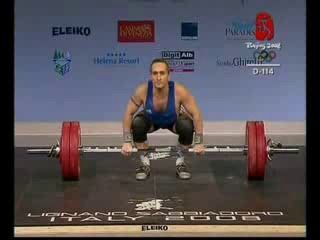

['CleanAndJerk', 'weight traning', 'BodyWeightSquats', 'PlayingTabla', 'Nunchucks'] /content/drive/MyDrive/intern/practice/UCF-101/CleanAndJerk/v_CleanAndJerk_g11_c04.avi


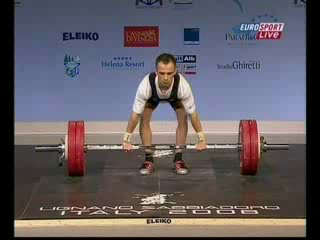

['CleanAndJerk', 'weight traning', 'BenchPress', 'HandstandPushups', 'PoleVault'] /content/drive/MyDrive/intern/practice/UCF-101/CleanAndJerk/v_CleanAndJerk_g13_c01.avi


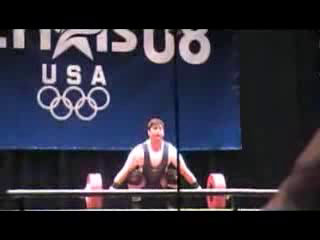

['CleanAndJerk', 'weight traning', 'ParallelBars', 'HammerThrow', 'Shotput'] /content/drive/MyDrive/intern/practice/UCF-101/CleanAndJerk/v_CleanAndJerk_g13_c02.avi


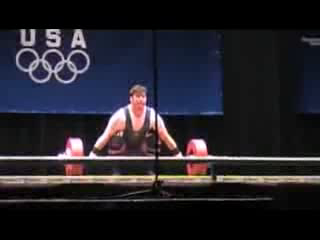

['CleanAndJerk', 'weight traning', 'ParallelBars', 'HammerThrow', 'JavelinThrow'] /content/drive/MyDrive/intern/practice/UCF-101/CleanAndJerk/v_CleanAndJerk_g15_c01.avi


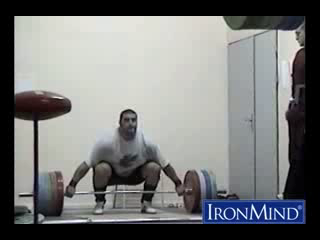

['CleanAndJerk', 'weight traning', 'ParallelBars', 'HammerThrow', 'JavelinThrow'] /content/drive/MyDrive/intern/practice/UCF-101/CleanAndJerk/v_CleanAndJerk_g15_c03.avi


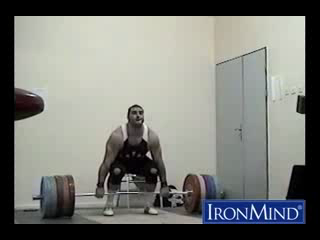

['CleanAndJerk', 'weight traning', 'HammerThrow', 'ParallelBars', 'JavelinThrow'] /content/drive/MyDrive/intern/practice/UCF-101/CleanAndJerk/v_CleanAndJerk_g15_c04.avi


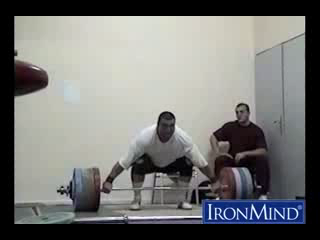

['CleanAndJerk', 'weight traning', 'BodyWeightSquats', 'ParallelBars', 'HandstandPushups'] /content/drive/MyDrive/intern/practice/UCF-101/CleanAndJerk/v_CleanAndJerk_g16_c01.avi


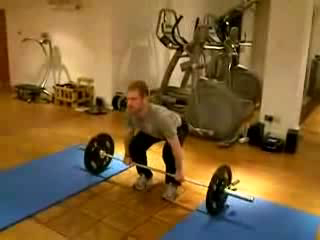

['weight traning', 'CleanAndJerk', 'ParallelBars', 'BodyWeightSquats', 'HammerThrow'] /content/drive/MyDrive/intern/practice/UCF-101/CleanAndJerk/v_CleanAndJerk_g16_c02.avi


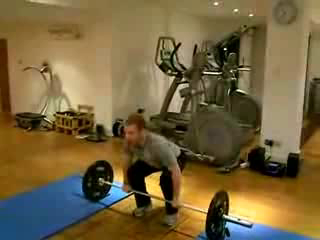

['CleanAndJerk', 'weight traning', 'JavelinThrow', 'ParallelBars', 'HandstandWalking'] /content/drive/MyDrive/intern/practice/UCF-101/CleanAndJerk/v_CleanAndJerk_g17_c02.avi


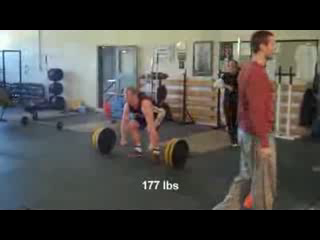

['CleanAndJerk', 'weight traning', 'JavelinThrow', 'HammerThrow', 'BodyWeightSquats'] /content/drive/MyDrive/intern/practice/UCF-101/CleanAndJerk/v_CleanAndJerk_g17_c03.avi


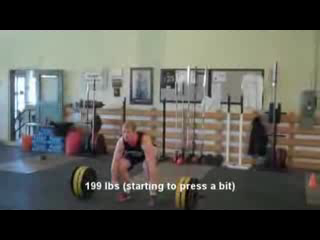

['CleanAndJerk', 'weight traning', 'Nunchucks', 'JumpRope', 'WritingOnBoard'] /content/drive/MyDrive/intern/practice/UCF-101/CleanAndJerk/v_CleanAndJerk_g18_c02.avi


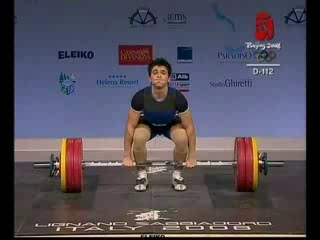

['CleanAndJerk', 'weight traning', 'BodyWeightSquats', 'ParallelBars', 'Nunchucks'] /content/drive/MyDrive/intern/practice/UCF-101/CleanAndJerk/v_CleanAndJerk_g18_c03.avi


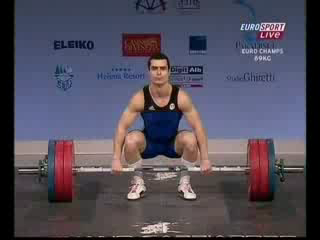

['CleanAndJerk', 'weight traning', 'ParallelBars', 'Nunchucks', 'ApplyEyeMakeup'] /content/drive/MyDrive/intern/practice/UCF-101/CleanAndJerk/v_CleanAndJerk_g18_c04.avi


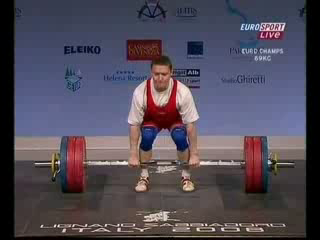

['CleanAndJerk', 'weight traning', 'ParallelBars', 'JavelinThrow', 'BenchPress'] /content/drive/MyDrive/intern/practice/UCF-101/CleanAndJerk/v_CleanAndJerk_g19_c03.avi


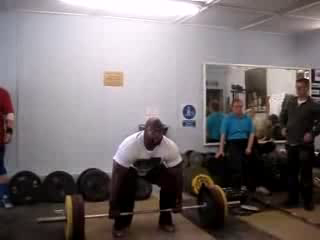

['CleanAndJerk', 'weight traning', 'ParallelBars', 'HammerThrow', 'JavelinThrow'] /content/drive/MyDrive/intern/practice/UCF-101/CleanAndJerk/v_CleanAndJerk_g22_c02.avi


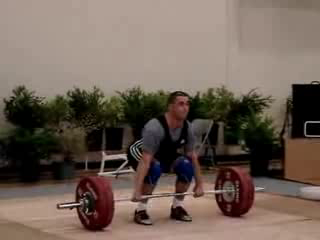

['weight traning', 'BodyWeightSquats', 'CleanAndJerk', 'Lunges', 'BenchPress'] /content/drive/MyDrive/intern/practice/UCF-101/CleanAndJerk/v_CleanAndJerk_g23_c02.avi


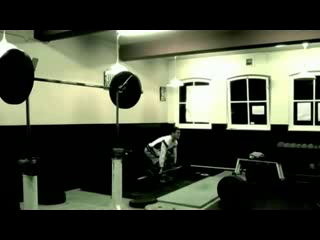

['CleanAndJerk', 'weight traning', 'BodyWeightSquats', 'BenchPress', 'ParallelBars'] /content/drive/MyDrive/intern/practice/UCF-101/CleanAndJerk/v_CleanAndJerk_g23_c03.avi


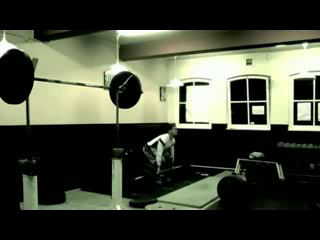

['CleanAndJerk', 'weight traning', 'HammerThrow', 'Shotput', 'ThrowDiscus'] /content/drive/MyDrive/intern/practice/UCF-101/CleanAndJerk/v_CleanAndJerk_g24_c01.avi


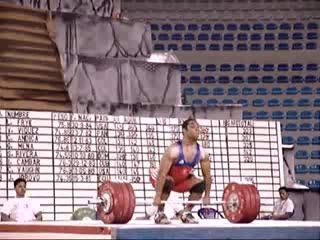

['CleanAndJerk', 'weight traning', 'Shotput', 'HammerThrow', 'JumpRope'] /content/drive/MyDrive/intern/practice/UCF-101/CleanAndJerk/v_CleanAndJerk_g24_c02.avi


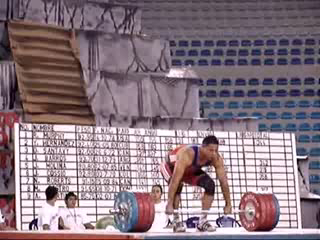

['CleanAndJerk', 'weight traning', 'Shotput', 'HandstandPushups', 'HandstandWalking'] /content/drive/MyDrive/intern/practice/UCF-101/CleanAndJerk/v_CleanAndJerk_g24_c03.avi


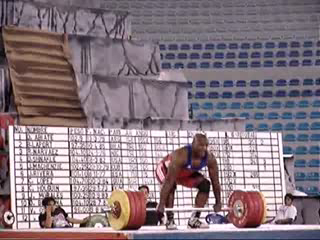

['CleanAndJerk', 'weight traning', 'Shotput', 'JumpRope', 'WritingOnBoard'] /content/drive/MyDrive/intern/practice/UCF-101/CleanAndJerk/v_CleanAndJerk_g24_c04.avi


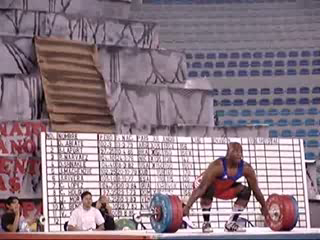

['CleanAndJerk', 'weight traning', 'ParallelBars', 'Nunchucks', 'ApplyEyeMakeup'] /content/drive/MyDrive/intern/practice/UCF-101/CleanAndJerk/v_CleanAndJerk_g25_c01.avi


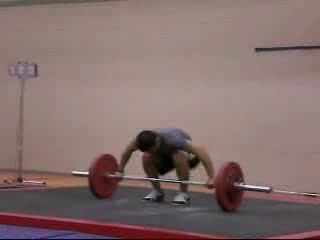

['CleanAndJerk', 'weight traning', 'ParallelBars', 'HammerThrow', 'JumpRope'] /content/drive/MyDrive/intern/practice/UCF-101/CleanAndJerk/v_CleanAndJerk_g25_c02.avi


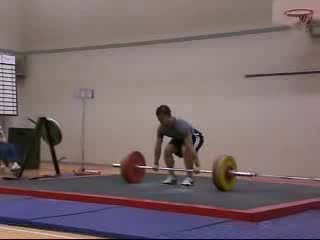

['CleanAndJerk', 'weight traning', 'ParallelBars', 'Nunchucks', 'ApplyEyeMakeup'] /content/drive/MyDrive/intern/practice/UCF-101/CleanAndJerk/v_CleanAndJerk_g25_c03.avi


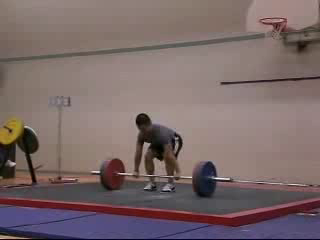

['CleanAndJerk', 'weight traning', 'ParallelBars', 'Nunchucks', 'ApplyEyeMakeup'] /content/drive/MyDrive/intern/practice/UCF-101/CleanAndJerk/v_CleanAndJerk_g25_c04.avi


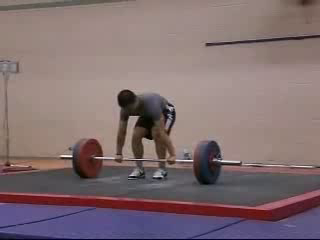

['weight traning', 'LongJump', 'PoleVault', 'HammerThrow', 'Shotput'] /content/drive/MyDrive/intern/practice/UCF-101/JavelinThrow/v_JavelinThrow_g05_c02.avi


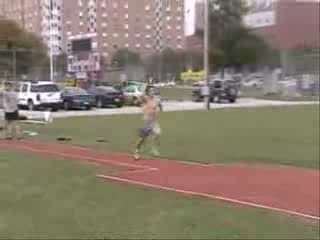

['BodyWeightSquats', 'weight traning', 'Lunges', 'HandstandPushups', 'ParallelBars'] /content/drive/MyDrive/intern/practice/UCF-101/JumpingJack/v_JumpingJack_g02_c01.avi


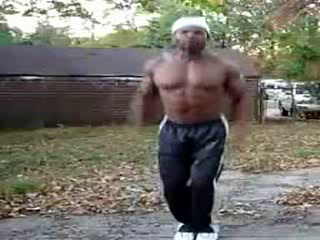

['BenchPress', 'weight traning', 'ParallelBars', 'CleanAndJerk', 'BodyWeightSquats'] /content/drive/MyDrive/intern/practice/UCF-101/JumpingJack/v_JumpingJack_g02_c03.avi


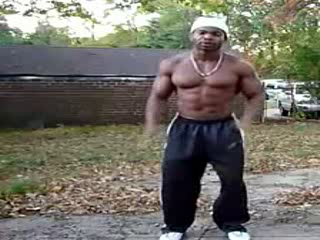

['weight traning', 'BodyWeightSquats', 'CleanAndJerk', 'JumpRope', 'HandstandWalking'] /content/drive/MyDrive/intern/practice/UCF-101/JumpingJack/v_JumpingJack_g02_c04.avi


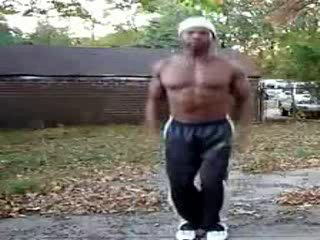

['JumpRope', 'weight traning', 'PushUps', 'WallPushups', 'BenchPress'] /content/drive/MyDrive/intern/practice/UCF-101/JumpingJack/v_JumpingJack_g03_c01.avi


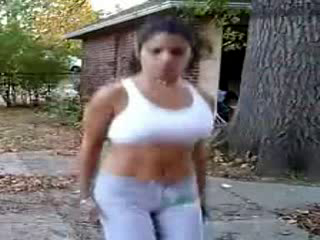

['JumpRope', 'weight traning', 'PushUps', 'HandstandPushups', 'HulaHoop'] /content/drive/MyDrive/intern/practice/UCF-101/JumpingJack/v_JumpingJack_g03_c02.avi


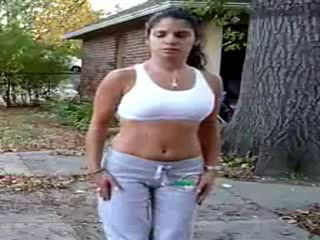

['weight traning', 'JumpRope', 'HandstandWalking', 'WallPushups', 'BasketballDunk'] /content/drive/MyDrive/intern/practice/UCF-101/JumpingJack/v_JumpingJack_g03_c04.avi


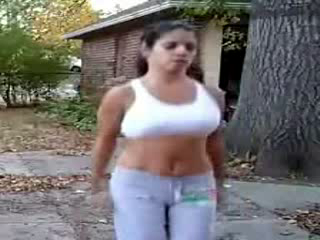

['BodyWeightSquats', 'weight traning', 'HandstandPushups', 'HandstandWalking', 'JumpRope'] /content/drive/MyDrive/intern/practice/UCF-101/JumpingJack/v_JumpingJack_g04_c01.avi


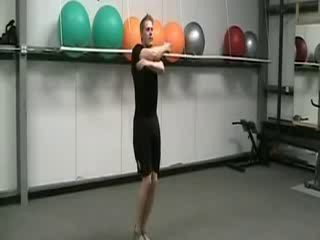

['JumpRope', 'weight traning', 'FloorGymnastics', 'BodyWeightSquats', 'Lunges'] /content/drive/MyDrive/intern/practice/UCF-101/JumpingJack/v_JumpingJack_g19_c06.avi


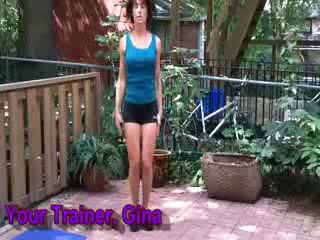

['JumpRope', 'weight traning', 'BodyWeightSquats', 'RopeClimbing', 'CleanAndJerk'] /content/drive/MyDrive/intern/practice/UCF-101/JumpingJack/v_JumpingJack_g19_c07.avi


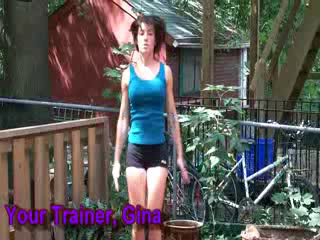

['weight traning', 'BoxingSpeedBag', 'BodyWeightSquats', 'CleanAndJerk', 'HammerThrow'] /content/drive/MyDrive/intern/practice/UCF-101/BodyWeightSquats/v_BodyWeightSquats_g02_c02.avi


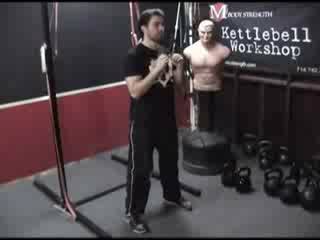

['BodyWeightSquats', 'weight traning', 'CleanAndJerk', 'HandstandPushups', 'WallPushups'] /content/drive/MyDrive/intern/practice/UCF-101/BodyWeightSquats/v_BodyWeightSquats_g02_c01.avi


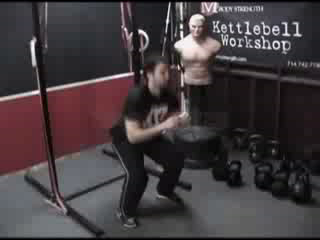

['weight traning', 'BodyWeightSquats', 'BoxingSpeedBag', 'HammerThrow', 'BoxingPunchingBag'] /content/drive/MyDrive/intern/practice/UCF-101/BodyWeightSquats/v_BodyWeightSquats_g02_c03.avi


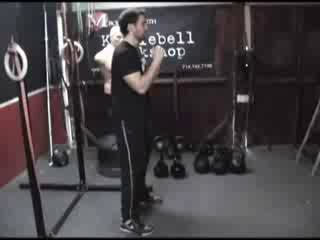

In [96]:
text_search("/content/drive/MyDrive/intern/practice/UCF-101/","weight traning")

In [97]:
len(classes)

101

In [98]:
video1=imageio.mimread("/content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g02_c02.avi")
HTML(display_video(video1).to_html5_video())

In [100]:
video1=imageio.mimread("/content/drive/MyDrive/intern/practice/UCF-101/BenchPress/v_BenchPress_g02_c07.avi")
HTML(display_video(video1).to_html5_video())